In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.datasets import load_iris
from scipy import stats
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier

# Connecting to Dataframe

In [55]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [56]:
df = pd.read_csv("/content/drive/MyDrive/adverts_simp.csv")
df

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202010285512735,115000.0,08,Black,Land Rover,Range Rover Sport,USED,2008.0,6200,SUV,False,Diesel
1,202008052100452,16141.0,68,Grey,Peugeot,2008,USED,2018.0,14795,SUV,False,Petrol
2,202002057001587,17328.0,16,Silver,Vauxhall,Mokka,USED,2016.0,10000,Hatchback,False,Diesel
3,202009123648675,43708.0,65,Grey,Audi,RS3,USED,2015.0,29995,Hatchback,False,Petrol
4,202009033261258,26040.0,65,Grey,Honda,Civic,USED,NaN,8490,Hatchback,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
99995,202010084742210,43886.0,66,Black,Audi,A4 Avant,USED,2016.0,14750,Estate,False,Diesel
99996,202009284325579,23900.0,16,White,BMW,1 Series,USED,2016.0,12989,Hatchback,False,Petrol
99997,202003047999261,5.0,NaN,Grey,Land Rover,Range Rover,NEW,NaN,77843,SUV,False,Diesel
99998,202009183902863,29858.0,66,Blue,Mercedes-Benz,S Class,USED,2016.0,26980,Saloon,False,Diesel


# Data | Domain Understanding and Exploration




In [57]:
df.size

1200000

In [58]:
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202010285512735,115000.0,08,Black,Land Rover,Range Rover Sport,USED,2008.0,6200,SUV,False,Diesel
1,202008052100452,16141.0,68,Grey,Peugeot,2008,USED,2018.0,14795,SUV,False,Petrol
2,202002057001587,17328.0,16,Silver,Vauxhall,Mokka,USED,2016.0,10000,Hatchback,False,Diesel
3,202009123648675,43708.0,65,Grey,Audi,RS3,USED,2015.0,29995,Hatchback,False,Petrol
4,202009033261258,26040.0,65,Grey,Honda,Civic,USED,NaN,8490,Hatchback,False,Petrol


In [59]:
df.tail()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
99995,202010084742210,43886.0,66,Black,Audi,A4 Avant,USED,2016.0,14750,Estate,False,Diesel
99996,202009284325579,23900.0,16,White,BMW,1 Series,USED,2016.0,12989,Hatchback,False,Petrol
99997,202003047999261,5.0,NaN,Grey,Land Rover,Range Rover,NEW,NaN,77843,SUV,False,Diesel
99998,202009183902863,29858.0,66,Blue,Mercedes-Benz,S Class,USED,2016.0,26980,Saloon,False,Diesel
99999,202010024494677,10.0,70,White,Vauxhall,Corsa,USED,2020.0,16300,Hatchback,False,Petrol


In [60]:
df.shape

(100000, 12)

In [61]:
df.isnull()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
99995,False,False,False,False,False,False,False,False,False,False,False,False
99996,False,False,False,False,False,False,False,False,False,False,False,False
99997,False,False,True,False,False,False,False,True,False,False,False,False
99998,False,False,False,False,False,False,False,False,False,False,False,False


In [62]:
df.isnull().sum()

public_reference            0
mileage                    40
reg_code                 7969
standard_colour          1318
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration     8313
price                       0
body_type                 193
crossover_car_and_van       0
fuel_type                 153
dtype: int64

In [63]:
# Selecting only numeric columns
numeric_columns = df.select_dtypes(include=['int64', 'float64'])

# Calculate the range for each numeric column
ranges = numeric_columns.apply(lambda x: x.max() - x.min())
ranges

public_reference        7.038378e+11
mileage                 9.900000e+05
year_of_registration    1.021000e+03
price                   9.999879e+06
dtype: float64

In [64]:
# Calculate centrality measures for numeric columns
centrality = numeric_columns.agg(['mean', 'median', lambda x: x.mode().iloc[0]], axis=0)
centrality

,public_reference,mileage,year_of_registration,price
mean,2.020071e+14,37637.37583,2015.005693,17374.91425
median,2.020093e+14,28500.00000,2016.000000,12685.00000
<lambda>,2.013072e+14,0.00000,2017.000000,8995.00000


In [65]:
# Calculate dispersion measures
dispersion = numeric_columns.agg(['var', 'std'], axis=0)
dispersion

,public_reference,mileage,year_of_registration,price
var,2.830839e+20,1.210261e+09,73.646958,2.570437e+09
std,1.682510e+10,3.478881e+04,8.581781,5.069948e+04


In [66]:
# Identify data types
data_types = df.dtypes
# Separate into qualitative (categorical) and quantitative (numeric)
qualitative_features = data_types[data_types == 'object'].index
quantitative_features = data_types[data_types != 'object'].index

print("Qualitative (Categorical) Features:")
qualitative_features
print()
print("Quantitative (Numeric) Features:")
quantitative_features

Qualitative (Categorical) Features:

Quantitative (Numeric) Features:


Index(['public_reference', 'mileage', 'year_of_registration', 'price',
       'crossover_car_and_van'],
      dtype='object')

# Sample Data

In [67]:
df = df.sample(600)
df.to_csv("/content/drive/MyDrive/sample_data.csv", index=False)
df

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
99038,202011015679274,68000.0,60,Silver,BMW,5 Series,USED,2010.0,8500,Saloon,False,Petrol
23535,202009023214065,69400.0,63,Black,Vauxhall,Mokka,USED,2013.0,7700,Hatchback,False,Diesel
59270,202010295588549,3358.0,69,Silver,Hyundai,i800,USED,2019.0,21000,MPV,False,Diesel
26691,202009254193988,28491.0,19,Silver,Mercedes-Benz,A Class,USED,2019.0,18990,Hatchback,False,Diesel
53964,202010245386758,77000.0,10,Yellow,Peugeot,Bipper Tepee,USED,2010.0,2800,MPV,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...,...
11152,202010275489422,60166.0,07,Blue,Renault,Clio,USED,2007.0,1499,Hatchback,False,Petrol
48545,202009053355903,9000.0,68,Blue,Mercedes-Benz,GLC Class,USED,2018.0,54995,Coupe,False,Petrol
28931,202010104856445,84000.0,13,White,BMW,3 Series,USED,2013.0,8497,Saloon,False,Diesel
78959,202010024507666,42643.0,67,White,BMW,1 Series,USED,2017.0,16490,Hatchback,False,Diesel


Make a copy of the msin dataset

In [68]:
df.copy = df.copy()

# Data Cleaning

In [69]:
df.dropna(inplace=True) # drops rows with any missing values
df.shape

(546, 12)

In [70]:
# Convert boolean column(s) to integers
df['crossover_car_and_van'] = df['crossover_car_and_van'].astype(int)

In [71]:
# Encoding categorical values using OneHotEncoder
ohe = OneHotEncoder(sparse=False, drop='first')  # drop the first column to avoid multicollinearity
# Selecting only object type columns
object_columns = df.select_dtypes(include=['object']).columns
# Fit and transform the selected columns
encoded_cols = pd.DataFrame(ohe.fit_transform(df[object_columns]))
# Get feature names for the new one-hot encoded columns
ohe_feature_names = ohe.get_feature_names_out(object_columns)
# Assigning the new column names
encoded_cols.columns = ohe_feature_names
# Drop original categorical columns from the DataFrame
df = df.drop(object_columns, axis=1)
# Concatenate the original DataFrame with the one-hot encoded columns
df = pd.concat([df, encoded_cols], axis=1)
# Display the transformed DataFrame
print(df)

       public_reference  mileage  year_of_registration    price  \
99038      2.020110e+14  68000.0                2010.0   8500.0   
23535      2.020090e+14  69400.0                2013.0   7700.0   
59270      2.020103e+14   3358.0                2019.0  21000.0   
26691      2.020093e+14  28491.0                2019.0  18990.0   
53964      2.020102e+14  77000.0                2010.0   2800.0   
...                 ...      ...                   ...      ...   
541                 NaN      NaN                   NaN      NaN   
542                 NaN      NaN                   NaN      NaN   
543                 NaN      NaN                   NaN      NaN   
544                 NaN      NaN                   NaN      NaN   
545                 NaN      NaN                   NaN      NaN   

       crossover_car_and_van  reg_code_03  reg_code_05  reg_code_06  \
99038                    0.0          NaN          NaN          NaN   
23535                    0.0          NaN          Na

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [72]:
df.fillna(0, inplace=True)  # Fill NaN values with 0

Makes a new csv file of the cleaned data

In [73]:
df.to_csv("/content/drive/MyDrive/cleaned_data.csv", index=False)

In [74]:
df_verify = pd.read_csv('/content/drive/My Drive/cleaned_data.csv')
print(df_verify)

      public_reference  mileage  year_of_registration    price  \
0         2.020110e+14  68000.0                2010.0   8500.0   
1         2.020090e+14  69400.0                2013.0   7700.0   
2         2.020103e+14   3358.0                2019.0  21000.0   
3         2.020093e+14  28491.0                2019.0  18990.0   
4         2.020102e+14  77000.0                2010.0   2800.0   
...                ...      ...                   ...      ...   
1082      0.000000e+00      0.0                   0.0      0.0   
1083      0.000000e+00      0.0                   0.0      0.0   
1084      0.000000e+00      0.0                   0.0      0.0   
1085      0.000000e+00      0.0                   0.0      0.0   
1086      0.000000e+00      0.0                   0.0      0.0   

      crossover_car_and_van  reg_code_03  reg_code_05  reg_code_06  \
0                       0.0          0.0          0.0          0.0   
1                       0.0          0.0          0.0          0.0 

In [75]:
for column in df.columns:
  print(f"Count of columns '{column}':")
  print(df[column].value_counts())
  print("\n")

Count of columns 'public_reference':
public_reference
0.000000e+00    541
2.020102e+14      1
2.020081e+14      1
2.020102e+14      1
2.020102e+14      1
               ... 
2.020032e+14      1
2.020101e+14      1
2.020093e+14      1
2.020023e+14      1
2.020101e+14      1
Name: count, Length: 547, dtype: int64


Count of columns 'mileage':
mileage
0.0        541
10.0         8
70000.0      7
55000.0      5
84000.0      5
          ... 
40795.0      1
12381.0      1
29454.0      1
13557.0      1
50061.0      1
Name: count, Length: 462, dtype: int64


Count of columns 'year_of_registration':
year_of_registration
0.0       541
2017.0     98
2016.0     72
2019.0     57
2020.0     50
2015.0     45
2018.0     45
2014.0     36
2012.0     29
2013.0     24
2011.0     15
2009.0     15
2010.0     14
2007.0     11
2008.0      9
2005.0      7
2006.0      5
2003.0      5
2001.0      2
1999.0      2
1997.0      2
2004.0      1
2002.0      1
1996.0      1
Name: count, dtype: int64


Count of columns 

In [76]:
df = df.drop(columns=['public_reference'])
df

,mileage,year_of_registration,price,crossover_car_and_van,reg_code_03,reg_code_05,reg_code_06,reg_code_07,reg_code_08,reg_code_09,...,body_type_MPV,body_type_Pickup,body_type_SUV,body_type_Saloon,fuel_type_Diesel Hybrid,fuel_type_Diesel Plug-in Hybrid,fuel_type_Electric,fuel_type_Petrol,fuel_type_Petrol Hybrid,fuel_type_Petrol Plug-in Hybrid
99038,68000.0,2010.0,8500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23535,69400.0,2013.0,7700.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59270,3358.0,2019.0,21000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26691,28491.0,2019.0,18990.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
53964,77000.0,2010.0,2800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
542,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
543,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
544,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [77]:
x = df.drop(columns=['price', 'mileage'])

Split the data

In [78]:
x = df.drop(['mileage'], axis=1)
y = df['mileage']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=40)

scaler = StandardScaler()
x_train_scaler = scaler.fit_transform(x_train)
x_test_scaler = scaler.transform(x_test)

# Histograms

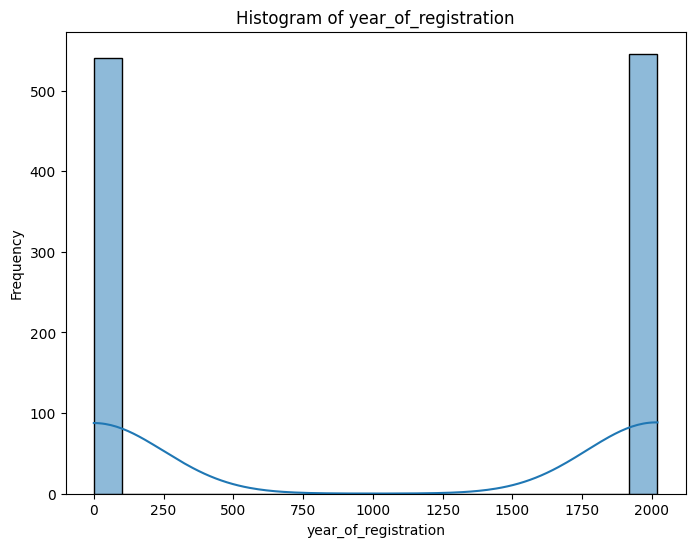

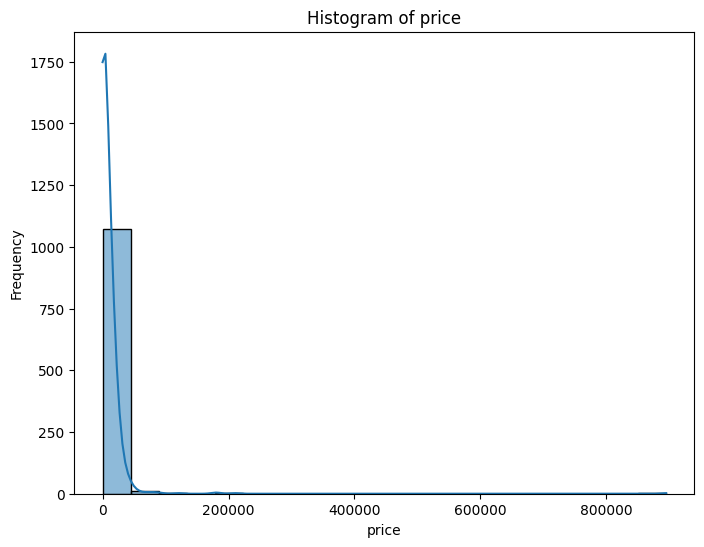

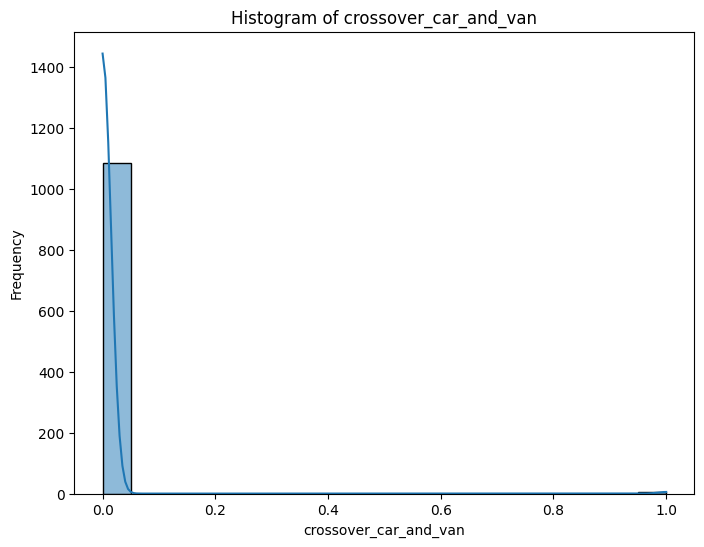

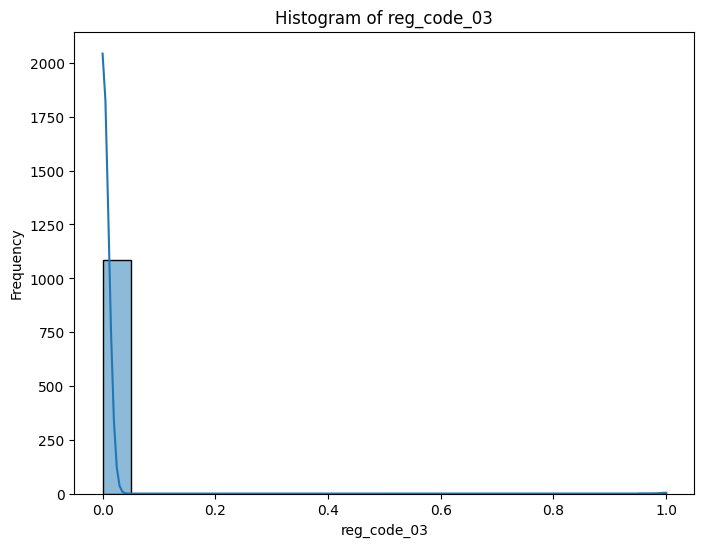

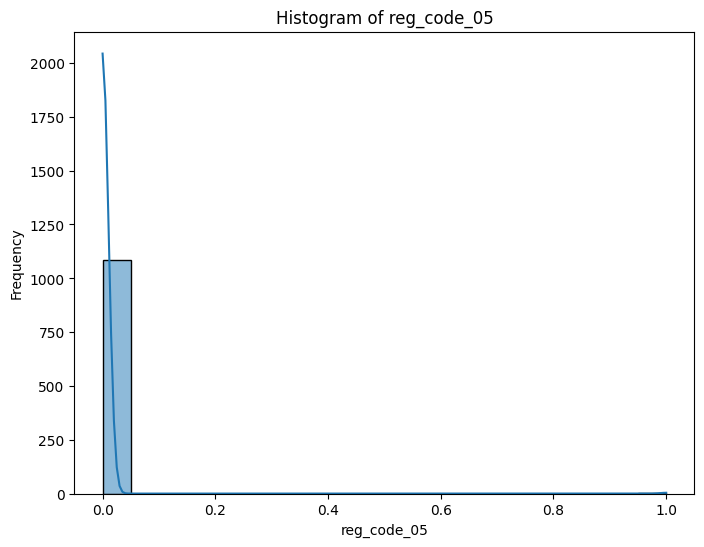

...

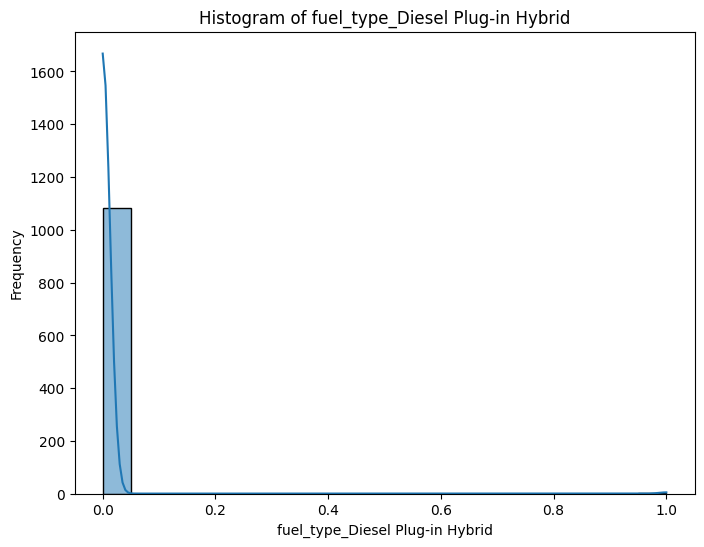

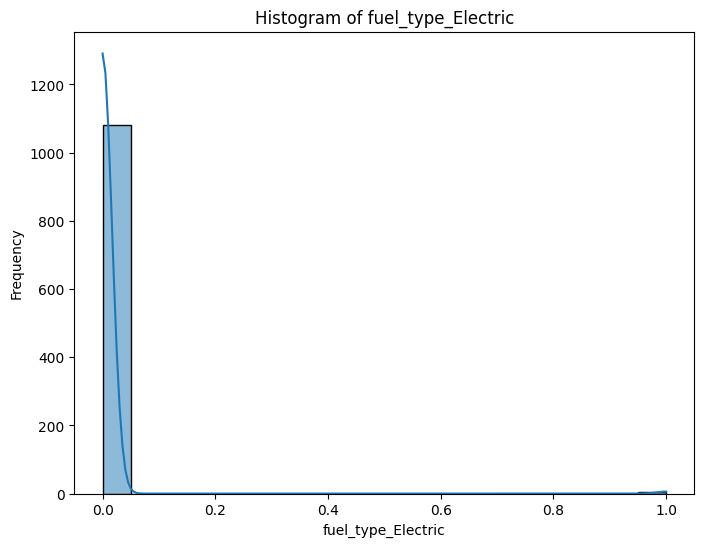

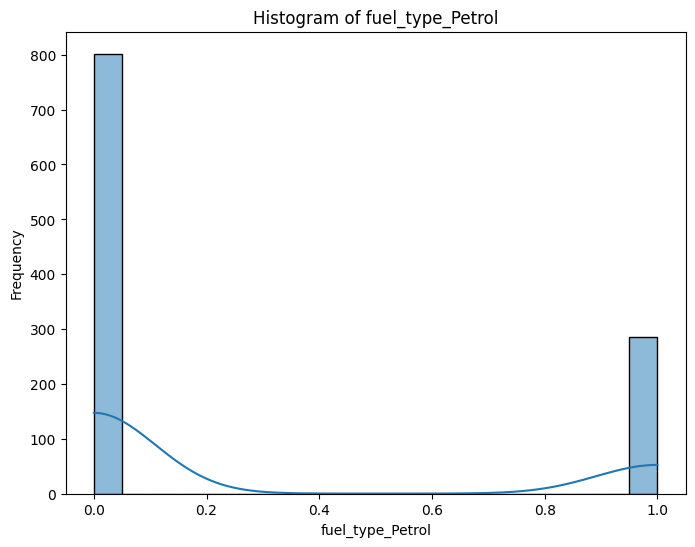

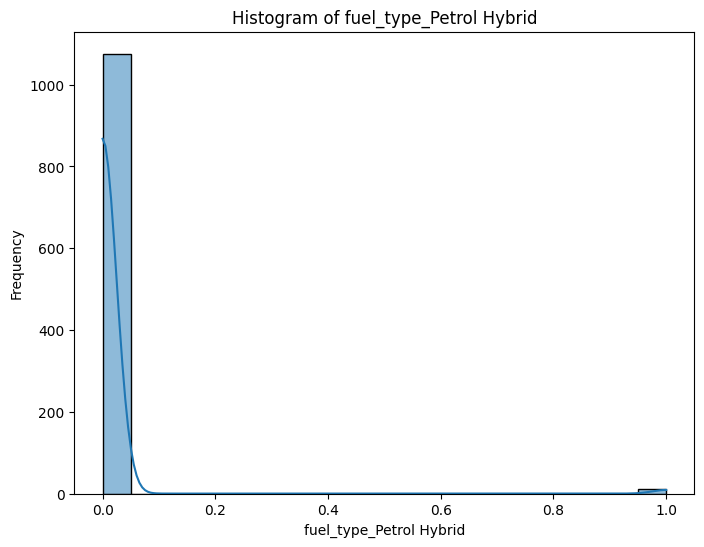

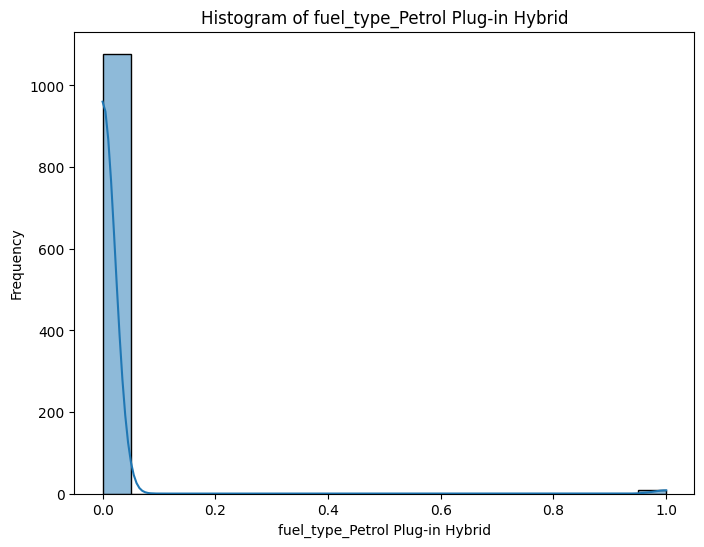

In [79]:
num_features = x.select_dtypes(include=['int64', 'float64']).columns
for feature in num_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=x, x=feature, bins=20, kde=True)
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

# Regressor

In [80]:
regressor = LinearRegression()
regressor.fit(x_train, y_train)

LinearRegression()

In [ ]:
y_pred = regressor.predict(x_test)

# Evaluation Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
r2

# Logistic Regression

In [82]:
logreg = LogisticRegression(max_iter=1000)
logreg.fit(x_train_scaler, y_train)

LogisticRegression(max_iter=1000)

# Random Forest Regressor

In [83]:
model = RandomForestRegressor(n_estimators=500, max_depth = 10, random_state=42)
model.fit(x_train_scaler, y_train)

RandomForestRegressor(max_depth=10, n_estimators=500, random_state=42)

# Pipeline

In [84]:
#Pipeline for preprocessing and modeling
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(random_state=42))
])

# Hyperparameter Tuning

In [ ]:
# Hyperparameter tuning is essential for enhancing performance.
param_grid = {
    'model__n_estimators': [100, 200, 500],
    'model__max_depth': [None, 10, 20, 30],
    'model__min_samples_split': [2, 5, 10]
}

random_search = RandomizedSearchCV(pipeline, param_distributions=param_grid, n_iter=10, cv=5, scoring='r2', random_state=42, n_jobs=-1)
random_search.fit(x_train_scaler, y_train)

print(f"Best parameters: {random_search.best_params_}")
print(f"Best cross-validation score (R-squared): {random_search.best_score_}")
best_model = random_search.best_estimator_

# Evaluation Metrics

In [ ]:
#Predictions
y_pred_train = best_model.predict(x_train_scaler)
y_pred_test = best_model.predict(x_test_scaler)

#Evaluation
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
print("Train R-squared:", r2_train)
print("Test R-squared:", r2_test)

#Visual Representation of Actual vs Predicited
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, alpha = 0.3)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted')
plt.show()

# r2 Score

In [ ]:
accuracy_score = r2_score(y_test,y_pred)
accuracy_score

# Cross Validation

In [ ]:
cv_scores = cross_val_score(model, x, y, cv=5)
print("Cross-Validation Mean R-squared:", np.mean(cv_scores))

# SHAP Framework

In [ ]:
# Load the Iris dataset
iris = load_iris()

x = iris.data  # Features
y = iris.target  # Target variable

# Define and train RandomForestRegressor
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(x_train, y_train)
# Create SHAP explainer object
explainer = shap.TreeExplainer(model)

# Generate SHAP values for test data
shap_values = explainer.shap_values(x_test)

# Plot summary
shap.summary_plot(shap_values, x_test, feature_names=iris.feature_names)